   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 30.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 35.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 30.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 39.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 21.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 38.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 422.8/422.8 kB 29.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete
Processing Datacluster_number_plates (1).jpg...
Detected Text for Datacluster_number_plates (1).jpg: ['AN', '0074', 'AP29']


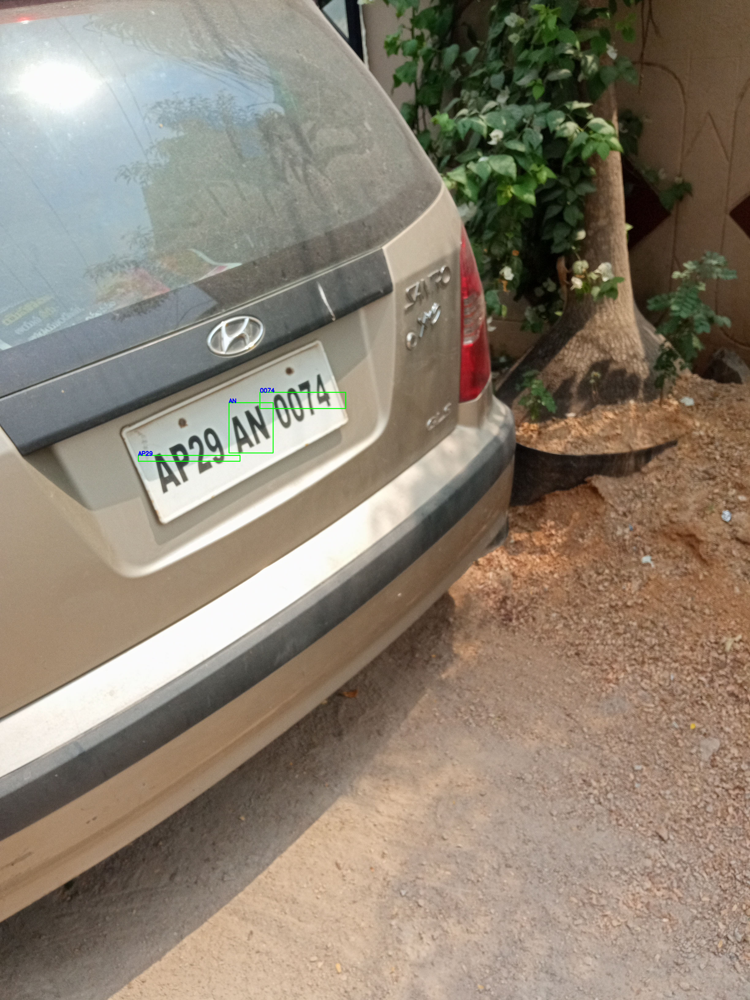


All Detected Texts:
Datacluster_number_plates (1).jpg: ['AN', '0074', 'AP29']


In [1]:
!pip install easyocr


from google.colab import drive
drive.mount('/content/drive')

# Import libraries
import os
import cv2
import easyocr
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# Initialize EasyOCR reader
reader = easyocr.Reader(['en'])

# Path to your dataset folder in Google Drive
dataset_path = '/content/drive/MyDrive/Indian_Number_Plates/Sample_Images'

# Function to detect and highlight number plate text
def detect_number_plate(image_path):
    img = cv2.imread(image_path)
    result = reader.readtext(img)

    number_plate_texts = []

    for detection in result:
        bbox, text, _ = detection
        number_plate_texts.append(text)

        # Draw rectangle around detected text
        top_left = tuple(map(int, bbox[0]))
        bottom_right = tuple(map(int, bbox[2]))
        cv2.rectangle(img, top_left, bottom_right, (0, 255, 0), 2)
        cv2.putText(img, text, top_left, cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

    return img, number_plate_texts

# Function to analyze all images in the dataset folder
def analyze_dataset(dataset_path):
    detected_texts = {}
    for image_filename in os.listdir(dataset_path):
        if image_filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            image_path = os.path.join(dataset_path, image_filename)
            print(f"\nProcessing {image_filename}...")
            result_img, plate_text = detect_number_plate(image_path)
            detected_texts[image_filename] = plate_text
            print(f"Detected Text for {image_filename}: {plate_text}")
            cv2_imshow(result_img)
    return detected_texts

# Run the analysis
detected_texts = analyze_dataset(dataset_path)

# Print all detected texts
print("\nAll Detected Texts:")
for filename, texts in detected_texts.items():
    print(f"{filename}: {texts}")
